In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
pd.options.display.float_format = '{:.3f}'.format
plt.rcParams["figure.dpi"] = 150
sns.set(style='darkgrid')
from sklearn.metrics import mean_absolute_error, mean_squared_error
from IPython.display import display
import warnings
warnings.simplefilter('ignore', UserWarning)

In [2]:
from pathlib import Path
score_dir = Path('../../../../score/scop_cl_equal_globular100_identity95_coverage60')
plot_dir = score_dir / 'plot'
plot_dir.mkdir(exist_ok=True)
tmscore_path = score_dir / 'scop_cl_equal_globular100_identity95_coverage60.csv'
df = pd.read_csv(tmscore_path, index_col=0).reset_index()

In [3]:
df

,index,Model,GDT_TS,GDT_HA,TMscore,target,template,seq_len,identity,positive,coverage,identity(-misres),positive(-misres),coverage(-misres),num_misres,Method,SF-DOMID
0,0,1AYZ_A_3OJ4_A_2_1,0.864,0.704,0.912,1AYZ_A,3OJ4_A_2,153,55,89,145,55,89,145,0,nofiltering,8034819
1,1,1AYZ_A_6TTU_D_1_4,0.861,0.686,0.911,1AYZ_A,6TTU_D_1,153,56,90,143,56,90,143,0,filtering,8034819
2,2,1AYZ_A_4L83_A_3_3,0.858,0.678,0.907,1AYZ_A,4L83_A_3,153,50,82,150,49,81,149,1,filtering,8034819
3,3,1AYZ_A_6TTU_D_1_5,0.851,0.678,0.898,1AYZ_A,6TTU_D_1,153,56,90,143,56,90,143,0,filtering,8034819
4,4,1AYZ_A_4GPR_A_1_1,0.842,0.688,0.872,1AYZ_A,4GPR_A_1,153,55,89,139,55,89,139,0,filtering,8034819
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26938,26938,6SPF_T_2WWQ_T_1_1,0.745,0.535,0.764,6SPF_T,2WWQ_T_1,94,49,66,92,49,66,92,0,nofiltering,8095263
26939,26939,6SPF_T_4BTD_X_2_4,0.859,0.705,0.845,6SPF_T,4BTD_X_2,94,42,56,88,42,56,88,0,nofiltering,8095263
26940,26940,6SPF_T_6GZ3_AX_3_3,0.763,0.646,0.756,6SPF_T,6GZ3_AX_3,94,25,39,90,25,39,90,0,nofiltering,8095263
26941,26941,6SPF_T_1P85_R_1_1,0.657,0.476,0.668,6SPF_T,1P85_R_1,94,51,68,94,39,49,88,24,nofiltering,8095263


In [4]:
sns.factorplot(data=df.query('Method == "nofiltering"').sort_values('target'), y='GDT_TS', col='target', kind='swarm', col_wrap=5)

In [5]:
sns.factorplot(data=df.query('Method == "filtering"').sort_values('target'), y='GDT_TS', col='target', kind='swarm', col_wrap=5)

In [6]:
label = 'GDT_TS'
figsize=(3, 3)
size=3

def swarmplot(data, title, label=label, figsize=figsize, size=size):
    plt.figure(figsize=figsize)
    plt.ylim([0.4, 1])
    sns.swarmplot(data=data, y=label, size=size)
    plt.title(title)
    plt.show()

import sys
sys.path.append('../../..')
from sampling_model import sample_restrict_around_best_model

def show_sampling(target: str):
    sample_target_df = df.query('target == @target').drop_duplicates(subset=['index', 'GDT_TS']).set_index('index')
    print(len(sample_target_df))
    unconstrained_df = sample_target_df.query('Method == "nofiltering"')
    swarmplot(data=unconstrained_df, title="Unconstrained")
    constrained_df = sample_target_df.query('Method == "filtering"')
    swarmplot(data=constrained_df, title='Constrained')
    swarmplot(data=sample_target_df, title='Concat')
    sampled_df = sample_restrict_around_best_model(sample_target_df)
    swarmplot(data=sampled_df, title='Sampled')

265


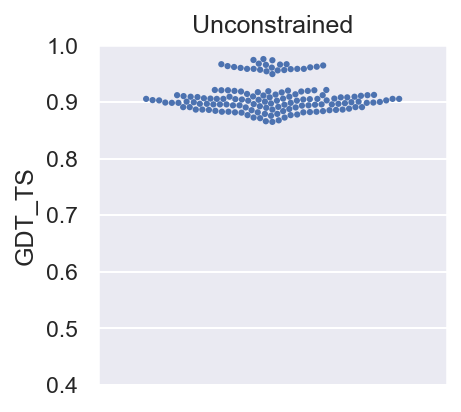

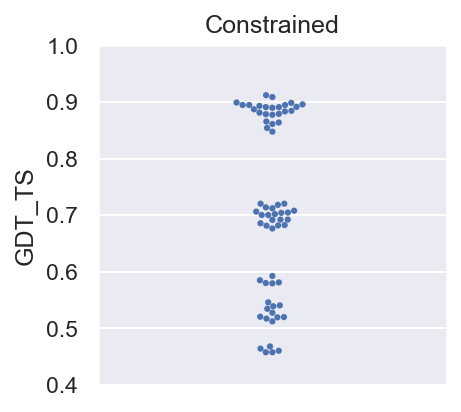

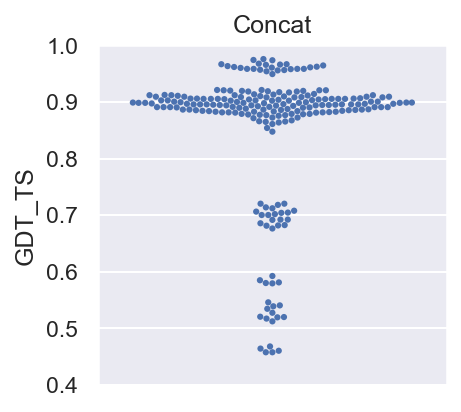

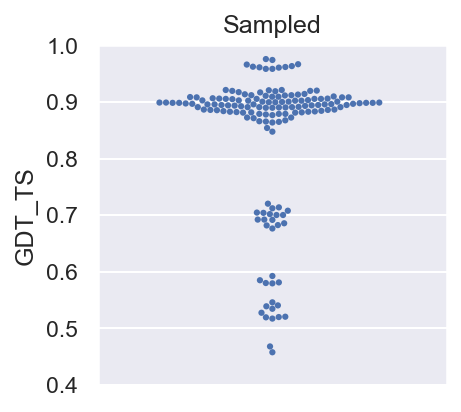

In [7]:
show_sampling('6KWQ_A')

270


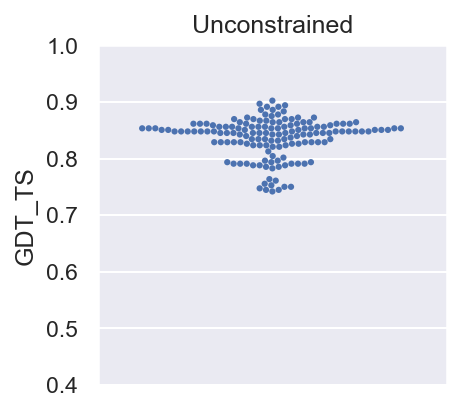

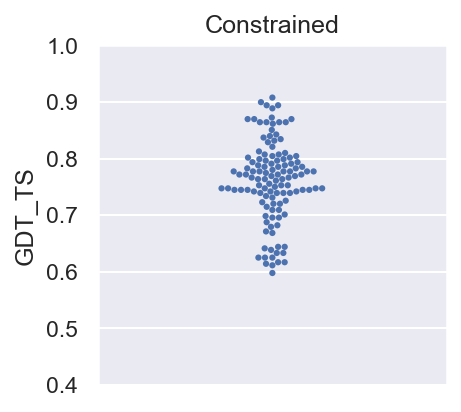

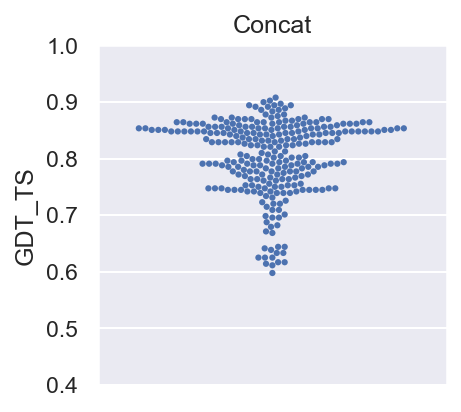

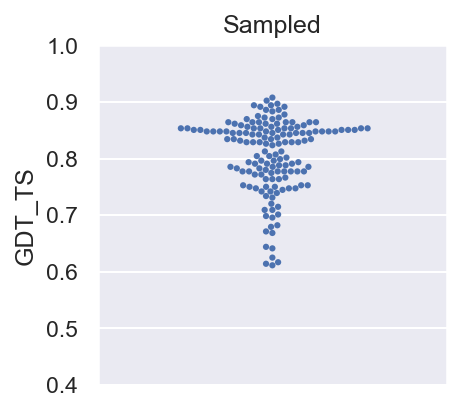

In [8]:
show_sampling('2V90_C')

280


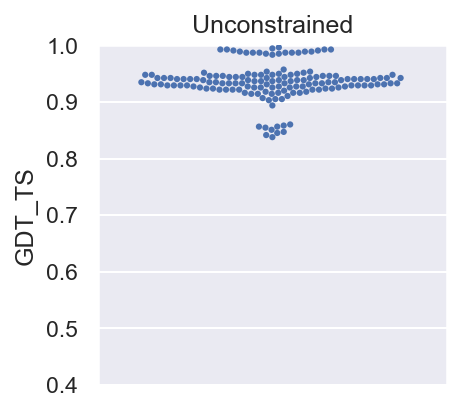

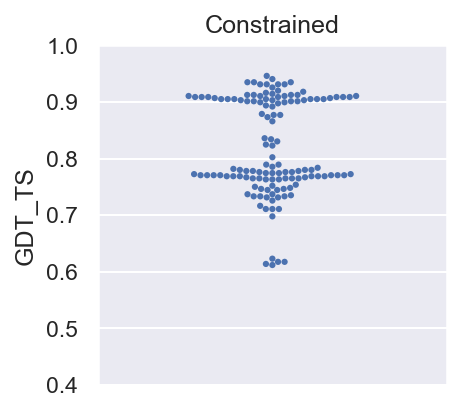

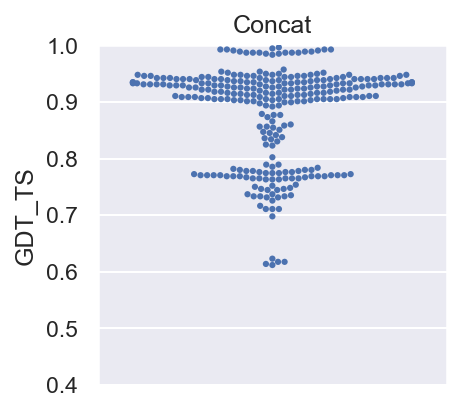

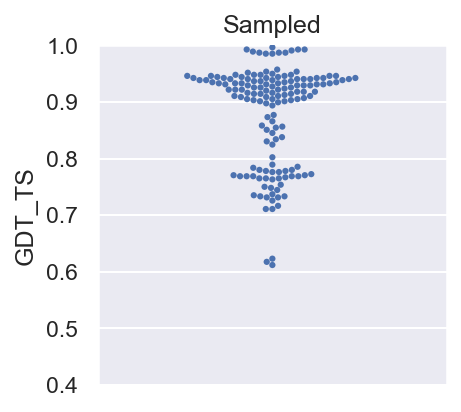

In [9]:
show_sampling('5JP5_A')

255


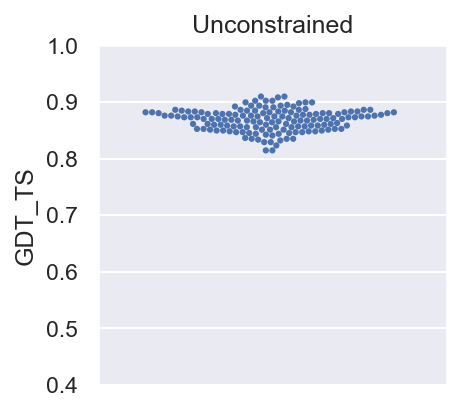

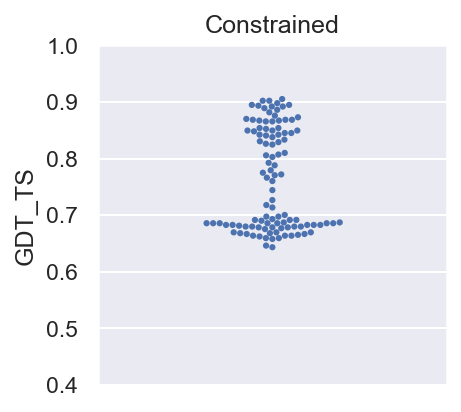

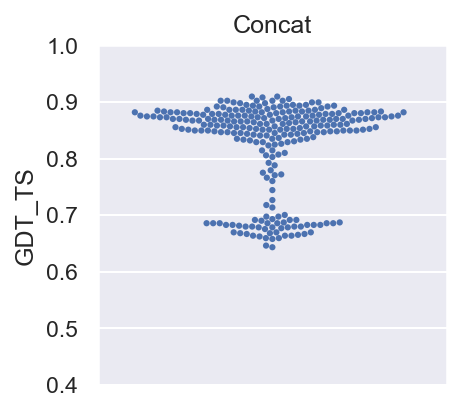

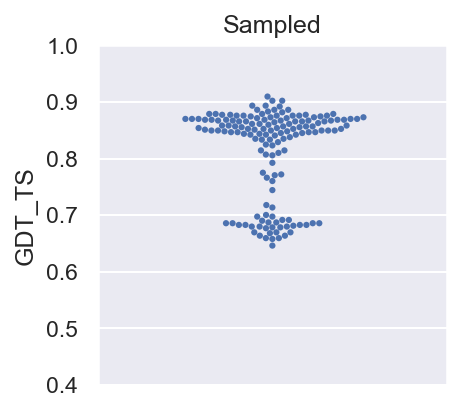

In [10]:
show_sampling('1UB7_A')

270


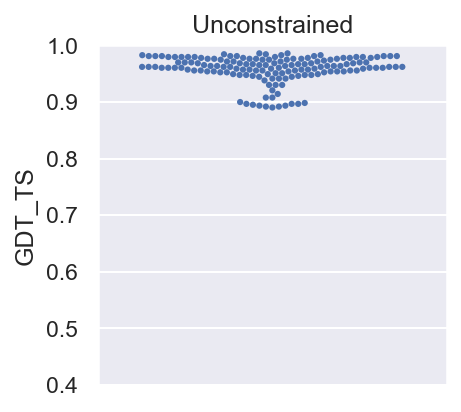

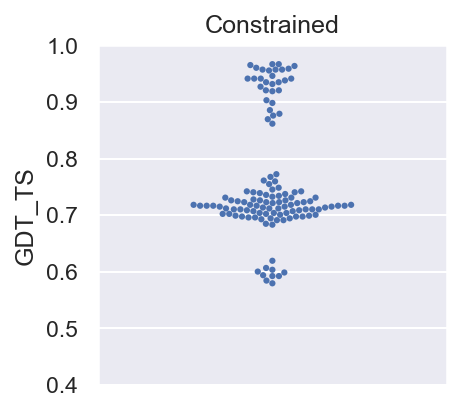

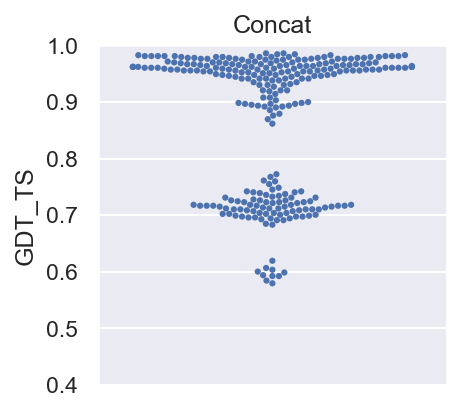

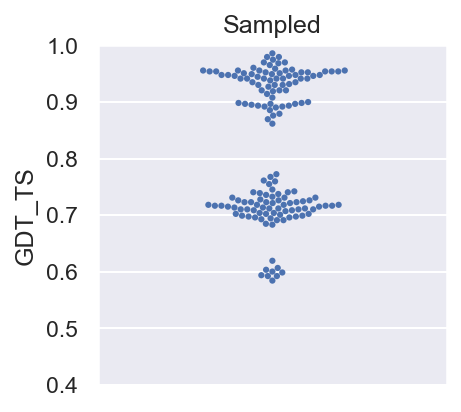

In [11]:
show_sampling('5XX9_B')